In [1]:
# script.py - converts given training dataset labels into YOLO acceptable format

import os
import pandas as pd

# Paths
images_dir = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/DFUC2021_train/images"
annotations_file = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/DFUC2021_train/train.csv"
labels_dir = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/DFUC2021_train/labels"

# Create the labels directory
os.makedirs(labels_dir, exist_ok=True)

# Load CSV
df = pd.read_csv(annotations_file)

# Define class mappings
class_mapping = {
    'none': 0,
    'infection': 1,
    'ischaemia': 2,
    'both': 3
}

# Iterate through rows
for _, row in df.iterrows():
    image_name = row['image']

    # Determine the class ID
    if row['none'] == 1:
        class_id = class_mapping['none']
    elif row['infection'] == 1:
        class_id = class_mapping['infection']
    elif row['ischaemia'] == 1:
        class_id = class_mapping['ischaemia']
    elif row['both'] == 1:
        class_id = class_mapping['both']
    else:
        continue  # Skip if no class is assigned

    # Prepare YOLO annotation (dummy bounding box as there are no coordinates in the CSV)
    # Default box: (x_center, y_center, width, height)
    x_center, y_center, width, height = 0.5, 0.5, 1.0, 1.0  # Full image assumed as the box

    # Write YOLO annotation to a file
    label_file = os.path.join(labels_dir, f"{os.path.splitext(image_name)[0]}.txt")
    with open(label_file, 'w') as f:
        f.write(f"{class_id} {x_center} {y_center} {width} {height}")

print("Annotations converted to YOLO format!")


Annotations converted to YOLO format!


In [4]:
# script(validation).py - same as script.py but for validation dataset

# Paths
images_dir = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/val/images"
annotations_file = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/val/val.csv"
labels_dir = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/val/labels"

# Create the labels directory
os.makedirs(labels_dir, exist_ok=True)

# Load CSV
df = pd.read_csv(annotations_file)

# Define class mappings
class_mapping = {
    'none': 0,
    'infection': 1,
    'ischaemia': 2,
    'both': 3
}

# Iterate through rows
for _, row in df.iterrows():
    image_name = row['image']

    # Determine the class ID
    if row['none'] == 1:
        class_id = class_mapping['none']
    elif row['infection'] == 1:
        class_id = class_mapping['infection']
    elif row['ischaemia'] == 1:
        class_id = class_mapping['ischaemia']
    elif row['both'] == 1:
        class_id = class_mapping['both']
    else:
        continue  # Skip if no class is assigned

    # Prepare YOLO annotation (dummy bounding box as there are no coordinates in the CSV)
    # Default box: (x_center, y_center, width, height)
    x_center, y_center, width, height = 0.5, 0.5, 1.0, 1.0  # Full image assumed as the box

    # Write YOLO annotation to a file
    label_file = os.path.join(labels_dir, f"{os.path.splitext(image_name)[0]}.txt")
    with open(label_file, 'w') as f:
        f.write(f"{class_id} {x_center} {y_center} {width} {height}")

print("Annotations converted to YOLO format!")


Annotations converted to YOLO format!


In [ ]:
# script(test).py - same as script.py but for validation dataset

import os
import pandas as pd

# Paths
images_dir = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images"
annotations_file = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/test.csv"
labels_dir = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/labels"

# Create the labels directory
os.makedirs(labels_dir, exist_ok=True)

# Load CSV
df = pd.read_csv(annotations_file)

# Define class mappings
class_mapping = {
    'none': 0,
    'infection': 1,
    'ischaemia': 2,
    'both': 3
}

# Iterate through rows
for _, row in df.iterrows():
    image_name = row['image']

    # Determine the class ID
    if row['none'] == 1:
        class_id = class_mapping['none']
    elif row['infection'] == 1:
        class_id = class_mapping['infection']
    elif row['ischaemia'] == 1:
        class_id = class_mapping['ischaemia']
    elif row['both'] == 1:
        class_id = class_mapping['both']
    else:
        continue  # Skip if no class is assigned

    # Prepare YOLO annotation (dummy bounding box as there are no coordinates in the CSV)
    # Default box: (x_center, y_center, width, height)
    x_center, y_center, width, height = 0.5, 0.5, 1.0, 1.0  # Full image assumed as the box

    # Write YOLO annotation to a file
    label_file = os.path.join(labels_dir, f"{os.path.splitext(image_name)[0]}.txt")
    with open(label_file, 'w') as f:
        f.write(f"{class_id} {x_center} {y_center} {width} {height}")

print("Annotations converted to YOLO format!")

In [8]:
# dataset.yaml - file for use of YOLO models

#path: /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427 # root folder for training and validation dataset

#train: train
#val: val
#test: test

#nc: 4

# the labels according to YOLO
#names:
#  0: none
#  1: infection
#  2: ischaemia
#  3: both


In [1]:
# DFU.py

from ultralytics import YOLO

# Load a YOLOv8 model
model = YOLO('yolov8n.pt')  # We can use yolov8s.pt or others

# Train the model
model.train(
    data='/home/rohanb/Documents/mca/ML Mini Project/dfu/dataset.yaml',
    epochs=50, # configuration of parameters for training
    imgsz=224,
    batch=32
)

New https://pypi.org/project/ultralytics/8.3.34 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.32 🚀 Python-3.12.7 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 5828MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/home/rohanb/Documents/mca/ML Mini Project/dfu/dataset.yaml, epochs=50, time=None, patience=100, batch=32, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=N

E0000 00:00:1732164293.544218  122363 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1732164293.558999  122363 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/DFUC2021_train
val: Scanning /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/validation/label


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       1.2G     0.2364      1.814     0.9839         79        320: 100%|██████████| 149/149 [00:16<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.325      0.769      0.475      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.19G     0.1585      1.101     0.9225         86        320: 100%|██████████| 149/149 [00:16<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.424      0.738      0.538      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.19G     0.1469       1.01     0.9119         85        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.375      0.763      0.551      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.19G     0.1481     0.9845       0.91         83        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.438      0.817      0.611      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.19G     0.1277     0.9489     0.9077         69        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.483      0.748      0.651      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.19G      0.118     0.9158      0.901         80        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.621      0.703      0.695      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.19G     0.1055     0.8832     0.8967         79        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.506      0.627      0.592      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.19G     0.1018     0.8791     0.8964         79        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.508      0.766      0.584      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.19G    0.09918     0.8698     0.8961         87        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.514       0.73      0.616      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.19G    0.09269     0.8528     0.8946         80        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.466      0.758      0.547      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.19G    0.08947      0.822     0.8943         87        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.402      0.743      0.461      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.19G    0.08322     0.8362     0.8941         84        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.559      0.646      0.625      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.18G    0.08384     0.8165     0.8928         84        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.595      0.739       0.71      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.19G    0.08068     0.8131      0.895         80        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.562      0.738      0.687      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.19G    0.07781     0.8011     0.8919         86        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.541      0.862      0.705      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.19G    0.07514     0.8001     0.8926         84        320: 100%|██████████| 149/149 [00:16<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.459      0.784      0.618      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.19G    0.07329     0.7805     0.8941         75        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.593      0.739       0.71      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.19G    0.07213     0.7716     0.8906         88        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.594      0.582      0.626      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.19G    0.06997     0.7688     0.8918         81        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.567       0.75      0.705      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.19G    0.06847      0.768     0.8899         75        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.527      0.786      0.717      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.19G    0.06569     0.7471     0.8897         81        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.559      0.698      0.669      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.19G    0.06474     0.7456     0.8936         80        320: 100%|██████████| 149/149 [00:16<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.702      0.674      0.733      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.19G    0.06308      0.746     0.8901         91        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.518      0.725       0.64      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.19G    0.06227     0.7297     0.8932         85        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.664      0.746      0.731      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.19G     0.0613     0.7238     0.8913         79        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.695      0.713      0.733      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.19G     0.0594     0.7169     0.8896         78        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.557      0.752        0.7      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.19G    0.05733      0.705      0.891         79        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192       0.58      0.759      0.731      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.19G    0.05557     0.7037     0.8893         85        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.579      0.736      0.681      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.19G    0.05419     0.7083     0.8922         78        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.546       0.79      0.712      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.19G    0.05301     0.6938     0.8911         82        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.648      0.683      0.725      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.19G    0.05378     0.6765     0.8884         69        320: 100%|██████████| 149/149 [00:16<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.621      0.747      0.756      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.19G    0.05237     0.6746     0.8894         79        320: 100%|██████████| 149/149 [00:16<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.623      0.735      0.739      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.19G     0.0506     0.6732     0.8897         75        320: 100%|██████████| 149/149 [00:16<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192       0.57      0.816      0.757      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.19G    0.04917     0.6598     0.8883         91        320: 100%|██████████| 149/149 [00:16<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.695      0.724       0.78       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.19G    0.04787     0.6608     0.8893         83        320: 100%|██████████| 149/149 [00:16<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.627      0.741      0.732      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.19G    0.04683     0.6485     0.8884         78        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.619      0.783      0.772      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.19G    0.04606     0.6416     0.8881         89        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.682      0.731       0.79      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.19G    0.04596     0.6177     0.8905         77        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.612      0.787      0.755      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.19G    0.04392      0.629     0.8877         83        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.613      0.724      0.728      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.19G    0.04206     0.6239       0.89         78        320: 100%|██████████| 149/149 [00:16<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.545      0.761      0.719      0.687


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.18G     0.0355     0.4919        0.9         27        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192       0.59        0.7      0.691      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.18G     0.0303     0.4291     0.8956         27        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192       0.57      0.803      0.732      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.18G    0.02885     0.3986     0.8984         27        320: 100%|██████████| 149/149 [00:16<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.555      0.768       0.72      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.19G     0.0265     0.3715     0.9005         27        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.663      0.671      0.705      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.18G    0.02583     0.3532     0.8945         27        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.582      0.725      0.726      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.18G     0.0242     0.3459     0.8972         27        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.604       0.75      0.747      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.18G    0.02214      0.338     0.8986         27        320: 100%|██████████| 149/149 [00:14<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.627      0.763      0.746      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.18G    0.02122     0.2982     0.8976         27        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.616      0.757      0.745      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.18G     0.0201     0.2919     0.8951         27        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192      0.602      0.787      0.749       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.18G    0.01965     0.2759     0.8956         27        320: 100%|██████████| 149/149 [00:15<00:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00

                   all       1192       1192       0.61      0.772      0.753      0.745



50 epochs completed in 0.255 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.32 🚀 Python-3.12.7 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 5828MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00


                   all       1192       1192      0.681      0.732       0.79      0.766
                  none        504        504      0.695      0.891      0.845      0.825
             infection        500        500      0.824       0.57      0.801      0.789
             ischaemia         48         48      0.466      0.667       0.68      0.656
                  both        140        140       0.74        0.8      0.834      0.793
Speed: 0.1ms preprocess, 0.8ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/train


In [ ]:
# DFU2.py

from ultralytics import YOLO

# Load a YOLOv8 model
model = YOLO('yolov8s.pt')  # We can use yolov8s.pt or others

# Train the model
model.train(
    data='/home/rohanb/Documents/mca/ML Mini Project/dfu/dataset.yaml',
    epochs=50, # configuration of parameters for training
    imgsz=224,
    batch=32
)

In [ ]:
# DFU3.py

from ultralytics import YOLO

# Load a YOLOv8 model
model = YOLO('yolov8n.pt')  # We can use yolov8s.pt or others

# Train the model
model.train(
    data='/home/rohanb/Documents/mca/ML Mini Project/dfu/dataset.yaml',
    epochs=100, # configuration of parameters for training
    imgsz=224,
    batch=16
)

In [ ]:
# DFU4.py

from ultralytics import YOLO

# Load a YOLOv8 model
model = YOLO('yolov8s.pt')  # We can use yolov8s.pt or others

# Train the model
model.train(
    data='/home/rohanb/Documents/mca/ML Mini Project/dfu/dataset.yaml',
    epochs=100, # configuration of parameters for training
    imgsz=224,
    batch=16
)

In [1]:
# Print final metrics of DFU.py with model=yolov8n.pt, epochs=50, imgsz=224, batch=32

#print("Training Summary:")
#print(f"Validation mAP@0.5: {results.metrics['map50']}")
#print(f"Validation mAP@0.5:0.95: {results.metrics['map']}")
#print(f"Box Loss: {results.metrics['box_loss']}")
#print(f"Objectness Loss: {results.metrics['obj_loss']}")
#print(f"Classification Loss: {results.metrics['cls_loss']}")
import pandas as pd

# Load training logs
history_path = '/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train8/results.csv'
history = pd.read_csv(history_path)

# Display the first few rows of training history
print(history.head())

print(history.tail())


   epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1  11.9566         0.29511         1.99956         0.99151   
1      2  21.9920         0.18031         1.10679         0.91958   
2      3  31.8697         0.16133         1.01933         0.90511   
3      4  41.8303         0.15868         0.99201         0.90720   
4      5  51.6423         0.14268         0.94552         0.90455   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.38417            0.89870           0.55013   
1               0.41634            0.82211           0.53952   
2               0.48777            0.78776           0.56530   
3               0.31326            0.71516           0.41312   
4               0.44542            0.80447           0.57836   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.54312       0.22806       1.25980       0.11854  0.000413   
1              0.52219       0.26336       1

In [4]:
# Print final metrics of DFU2.py with model=yolov8s.pt, epochs=50, imgsz=224, batch=32

#print("Training Summary:")
#print(f"Validation mAP@0.5: {results.metrics['map50']}")
#print(f"Validation mAP@0.5:0.95: {results.metrics['map']}")
#print(f"Box Loss: {results.metrics['box_loss']}")
#print(f"Objectness Loss: {results.metrics['obj_loss']}")
#print(f"Classification Loss: {results.metrics['cls_loss']}")
import pandas as pd

# Load training logs
history_path = '/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train9/results.csv'
history = pd.read_csv(history_path)

# Display the first few rows of training history
print(history.head())

print(history.tail())

   epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1  17.8606         0.28812         1.43624         0.98577   
1      2  34.2237         0.17519         0.98905         0.91292   
2      3  50.0172         0.16289         0.93283         0.90346   
3      4  65.7504         0.16062         0.93591         0.90880   
4      5  81.4826         0.14769         0.90532         0.90360   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.60287            0.59457           0.47526   
1               0.49489            0.63139           0.51230   
2               0.40928            0.66677           0.46179   
3               0.37662            0.56643           0.51804   
4               0.50480            0.73141           0.57210   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.46171       0.13226       1.40973       0.06557  0.000413   
1              0.50974       0.23749       1

In [2]:
# Print final metrics of DFU3.py with model=yolov8n.pt, epochs=100, imgsz=224, batch=16

#print("Training Summary:")
#print(f"Validation mAP@0.5: {results.metrics['map50']}")
#print(f"Validation mAP@0.5:0.95: {results.metrics['map']}")
#print(f"Box Loss: {results.metrics['box_loss']}")
#print(f"Objectness Loss: {results.metrics['obj_loss']}")
#print(f"Classification Loss: {results.metrics['cls_loss']}")
import pandas as pd

# Load training logs
history_path = '/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train10/results.csv'
history = pd.read_csv(history_path)

# Display the first few rows of training history
print(history.head())

print(history.tail())

   epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1  14.4489         0.28080         1.80269         0.98003   
1      2  26.9688         0.18878         1.10251         0.91984   
2      3  39.2237         0.17354         1.03991         0.90812   
3      4  51.2324         0.15098         0.98489         0.90303   
4      5  63.0586         0.13835         0.93804         0.90281   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.42668            0.80096           0.53949   
1               0.43992            0.79860           0.49065   
2               0.53749            0.54015           0.33504   
3               0.45008            0.80396           0.57312   
4               0.71764            0.53399           0.57568   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.52212       0.24141       1.25507       0.13251  0.000415   
1              0.48018       0.23809       1

In [3]:
# Print final metrics of DFU4.py with model=yolov8s.pt, epochs=100, imgsz=224, batch=16

#print("Training Summary:")
#print(f"Validation mAP@0.5: {results.metrics['map50']}")
#print(f"Validation mAP@0.5:0.95: {results.metrics['map']}")
#print(f"Box Loss: {results.metrics['box_loss']}")
#print(f"Objectness Loss: {results.metrics['obj_loss']}")
#print(f"Classification Loss: {results.metrics['cls_loss']}")
import pandas as pd

# Load training logs
history_path = '/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train11/results.csv'
history = pd.read_csv(history_path)

# Display the first few rows of training history
print(history.head())

print(history.tail())

   epoch      time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1   22.5400         0.27020         1.32824         0.97251   
1      2   42.1409         0.18719         0.99273         0.91658   
2      3   61.5095         0.17071         0.95588         0.90875   
3      4   80.6337         0.15611         0.92587         0.90715   
4      5  100.4540         0.14300         0.90756         0.90548   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.31335            0.76857           0.41603   
1               0.29034            0.71839           0.34530   
2               0.64839            0.62281           0.56692   
3               0.50299            0.84015           0.55818   
4               0.48799            0.70898           0.57281   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.36112       0.39060       1.28205       0.24732  0.000415   
1              0.32630       0.53302  

Index(['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')


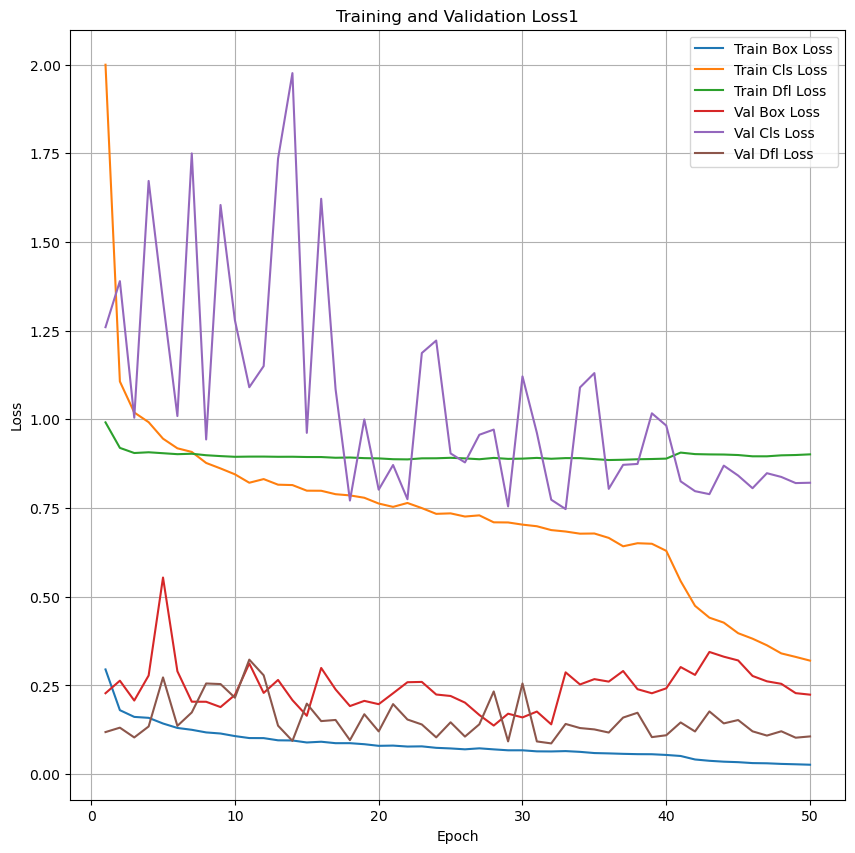

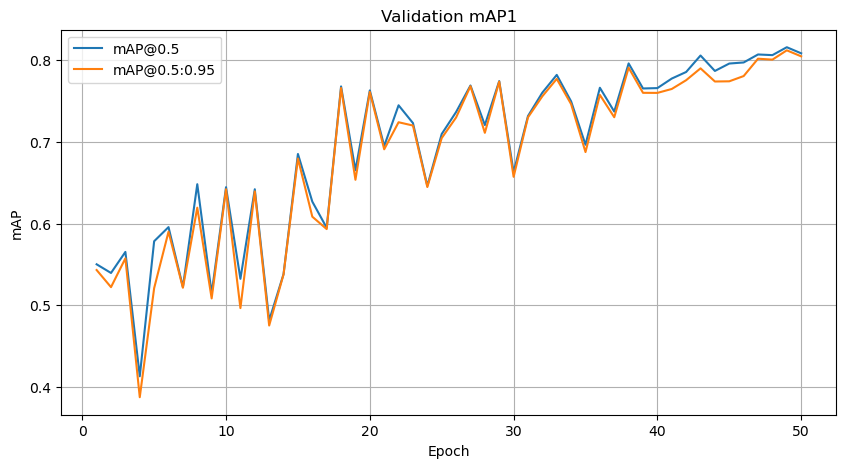

In [13]:
# visualize metrics of DFU.py with model=yolov8n.pt, epochs=50, imgsz=224, batch=32

import pandas as pd

import matplotlib.pyplot as plt

# Load the training history CSV
history_path = '/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train8/results.csv'
history = pd.read_csv(history_path)

# Display column names
print(history.columns)

# Plot training and validation loss
plt.figure(figsize=(10, 10))
plt.plot(history['epoch'], history['train/box_loss'], label='Train Box Loss')
plt.plot(history['epoch'], history['train/cls_loss'], label='Train Cls Loss')
plt.plot(history['epoch'], history['train/dfl_loss'], label='Train Dfl Loss')
plt.plot(history['epoch'], history['val/box_loss'], label='Val Box Loss')
plt.plot(history['epoch'], history['val/cls_loss'], label='Val Cls Loss')
plt.plot(history['epoch'], history['val/dfl_loss'], label='Val Dfl Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss1')
plt.legend()
plt.grid()
plt.show()

# Plot mAP
plt.figure(figsize=(10, 5))
plt.plot(history['epoch'], history['metrics/mAP50(B)'], label='mAP@0.5')
plt.plot(history['epoch'], history['metrics/mAP50-95(B)'], label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Validation mAP1')
plt.legend()
plt.grid()
plt.show()



Index(['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')


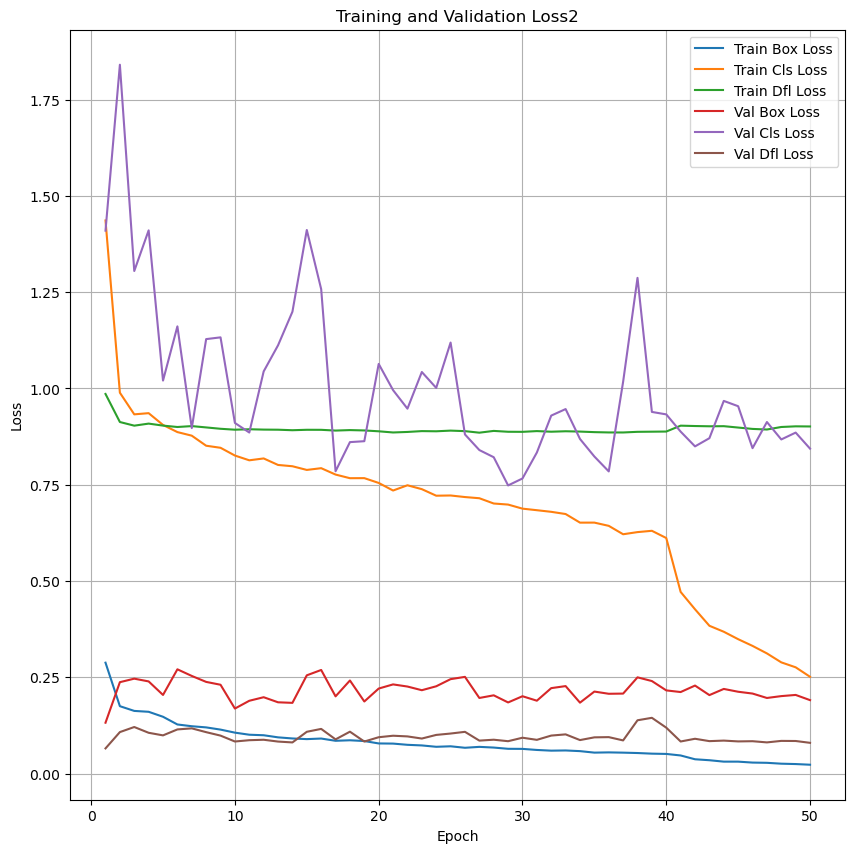

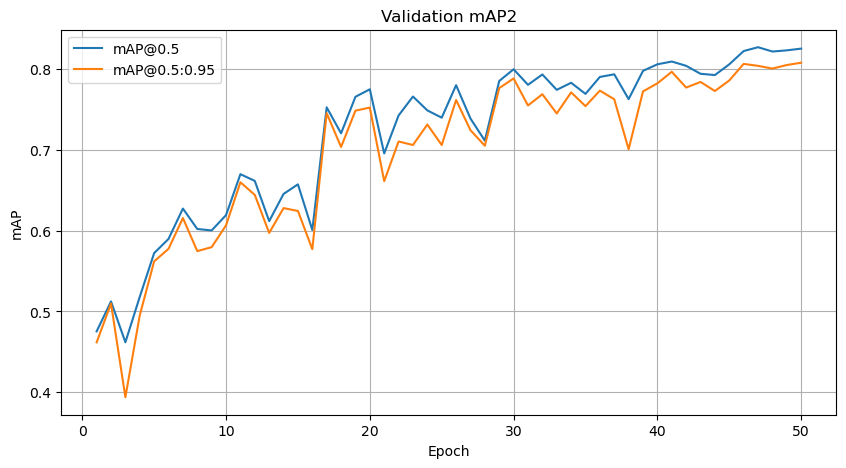

In [14]:
# visualize metrics of DFU2.py with model=yolov8s.pt, epochs=50, imgsz=224, batch=32

import pandas as pd

import matplotlib.pyplot as plt

# Load the training history CSV
history_path = '/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train9/results.csv'
history = pd.read_csv(history_path)

# Display column names
print(history.columns)

# Plot training and validation loss
plt.figure(figsize=(10, 10))
plt.plot(history['epoch'], history['train/box_loss'], label='Train Box Loss')
plt.plot(history['epoch'], history['train/cls_loss'], label='Train Cls Loss')
plt.plot(history['epoch'], history['train/dfl_loss'], label='Train Dfl Loss')
plt.plot(history['epoch'], history['val/box_loss'], label='Val Box Loss')
plt.plot(history['epoch'], history['val/cls_loss'], label='Val Cls Loss')
plt.plot(history['epoch'], history['val/dfl_loss'], label='Val Dfl Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss2')
plt.legend()
plt.grid()
plt.show()

# Plot mAP
plt.figure(figsize=(10, 5))
plt.plot(history['epoch'], history['metrics/mAP50(B)'], label='mAP@0.5')
plt.plot(history['epoch'], history['metrics/mAP50-95(B)'], label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Validation mAP2')
plt.legend()
plt.grid()
plt.show()

Index(['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')


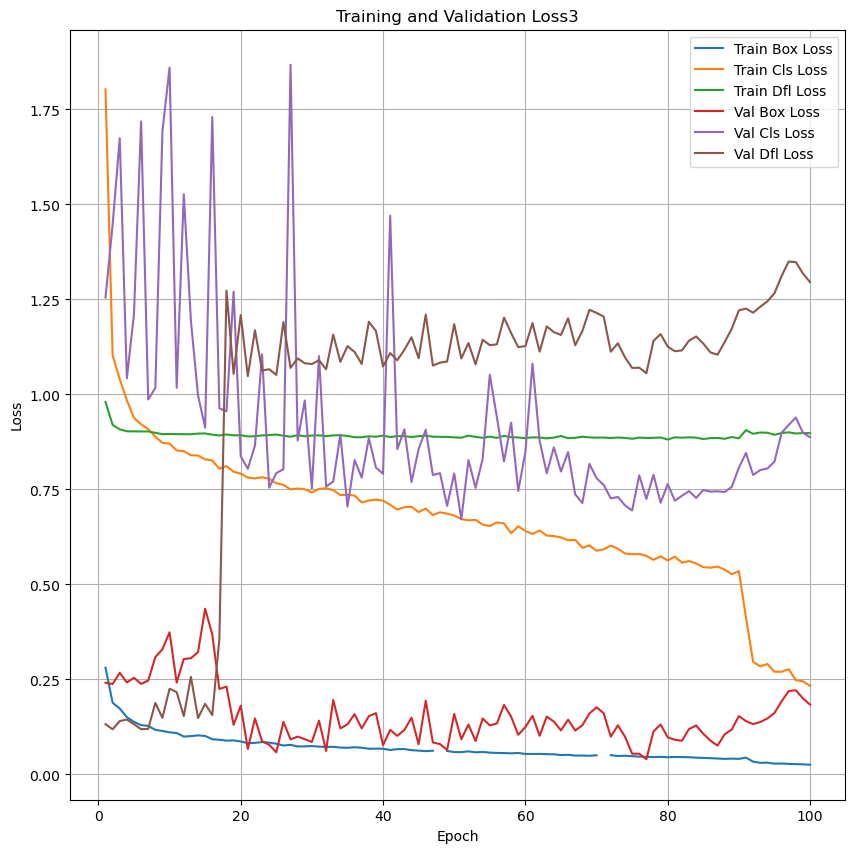

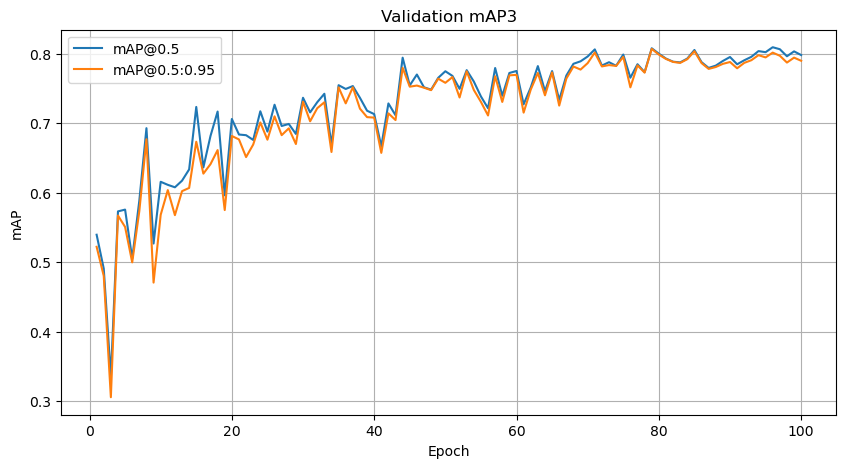

In [15]:
# visualize metrics of DFU3.py with model=yolov8n.pt, epochs=100, imgsz=224, batch=16

import pandas as pd

import matplotlib.pyplot as plt

# Load the training history CSV
history_path = '/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train10/results.csv'
history = pd.read_csv(history_path)

# Display column names
print(history.columns)

# Plot training and validation loss
plt.figure(figsize=(10, 10))
plt.plot(history['epoch'], history['train/box_loss'], label='Train Box Loss')
plt.plot(history['epoch'], history['train/cls_loss'], label='Train Cls Loss')
plt.plot(history['epoch'], history['train/dfl_loss'], label='Train Dfl Loss')
plt.plot(history['epoch'], history['val/box_loss'], label='Val Box Loss')
plt.plot(history['epoch'], history['val/cls_loss'], label='Val Cls Loss')
plt.plot(history['epoch'], history['val/dfl_loss'], label='Val Dfl Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss3')
plt.legend()
plt.grid()
plt.show()

# Plot mAP
plt.figure(figsize=(10, 5))
plt.plot(history['epoch'], history['metrics/mAP50(B)'], label='mAP@0.5')
plt.plot(history['epoch'], history['metrics/mAP50-95(B)'], label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Validation mAP3')
plt.legend()
plt.grid()
plt.show()

Index(['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')


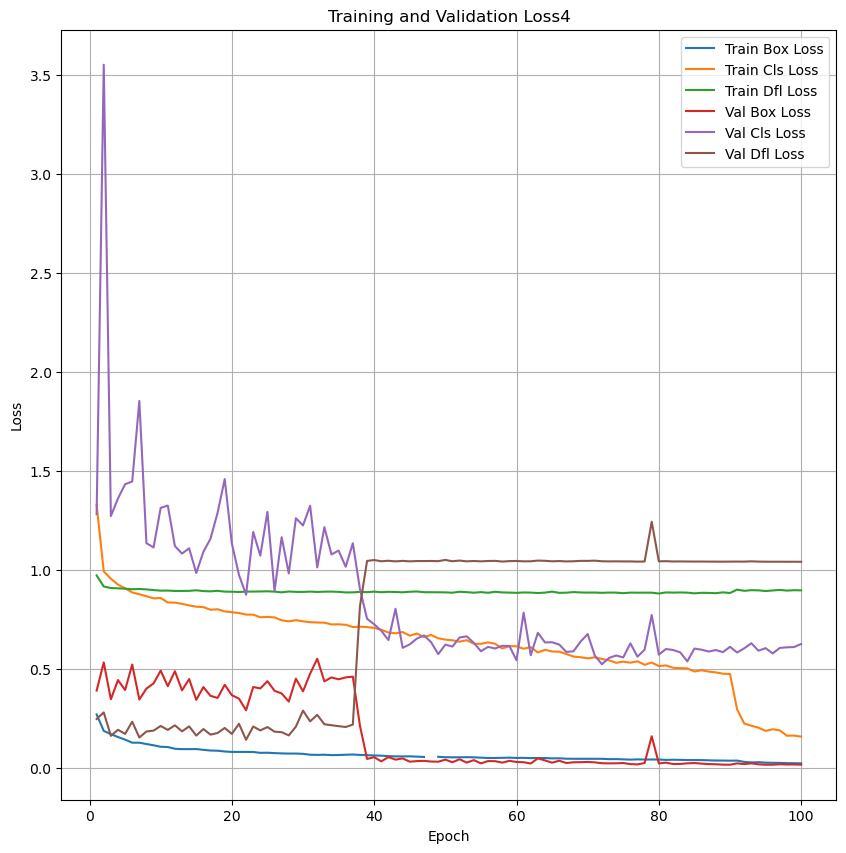

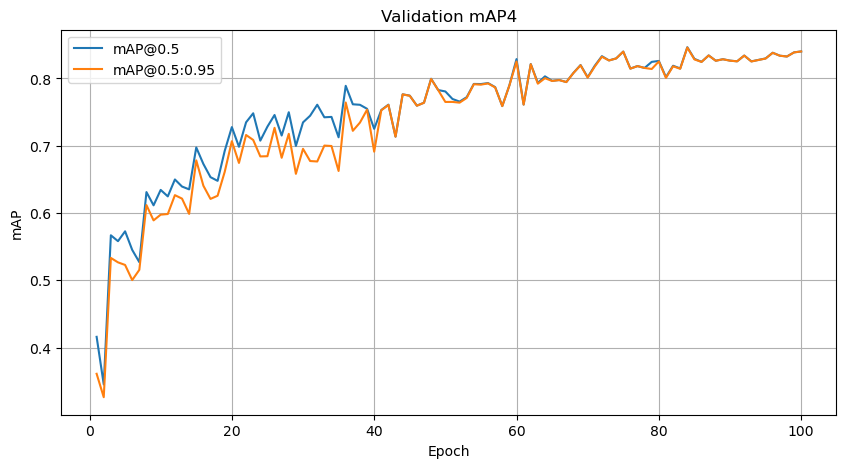

In [16]:
# visualize metrics of DFU4.py with model=yolov8s.pt, epochs=100, imgsz=224, batch=16

import pandas as pd

import matplotlib.pyplot as plt

# Load the training history CSV
history_path = '/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train11/results.csv'
history = pd.read_csv(history_path)

# Display column names
print(history.columns)

# Plot training and validation loss
plt.figure(figsize=(10, 10))
plt.plot(history['epoch'], history['train/box_loss'], label='Train Box Loss')
plt.plot(history['epoch'], history['train/cls_loss'], label='Train Cls Loss')
plt.plot(history['epoch'], history['train/dfl_loss'], label='Train Dfl Loss')
plt.plot(history['epoch'], history['val/box_loss'], label='Val Box Loss')
plt.plot(history['epoch'], history['val/cls_loss'], label='Val Cls Loss')
plt.plot(history['epoch'], history['val/dfl_loss'], label='Val Dfl Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss4')
plt.legend()
plt.grid()
plt.show()

# Plot mAP
plt.figure(figsize=(10, 5))
plt.plot(history['epoch'], history['metrics/mAP50(B)'], label='mAP@0.5')
plt.plot(history['epoch'], history['metrics/mAP50-95(B)'], label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Validation mAP4')
plt.legend()
plt.grid()
plt.show()

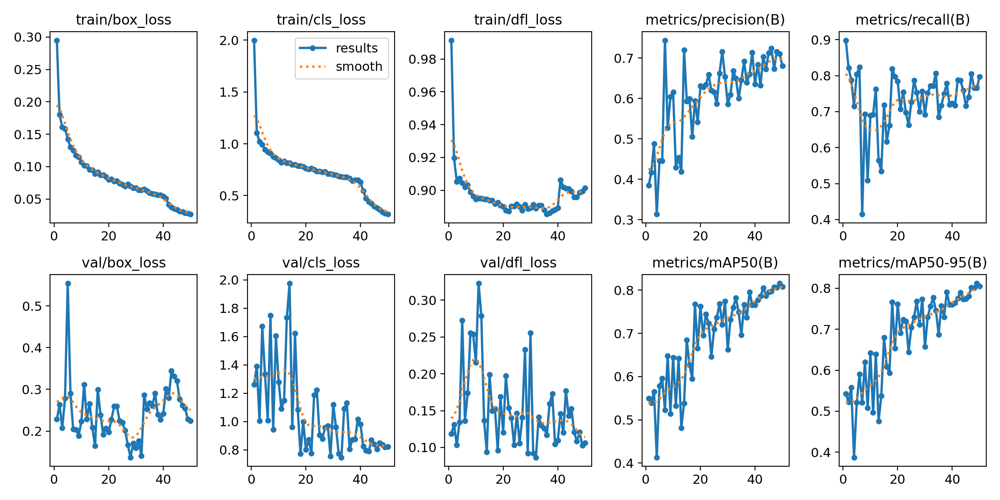

Results1


In [18]:
# display training metrics plot of of DFU.py with model=yolov8n.pt, epochs=50, imgsz=224, batch=32

from IPython.display import Image, display

# Path to the training metrics plot
metrics_plot_path = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train8/results.png"  # Update to the correct path

# Display the plot
display(Image(filename=metrics_plot_path))
print("Results1")

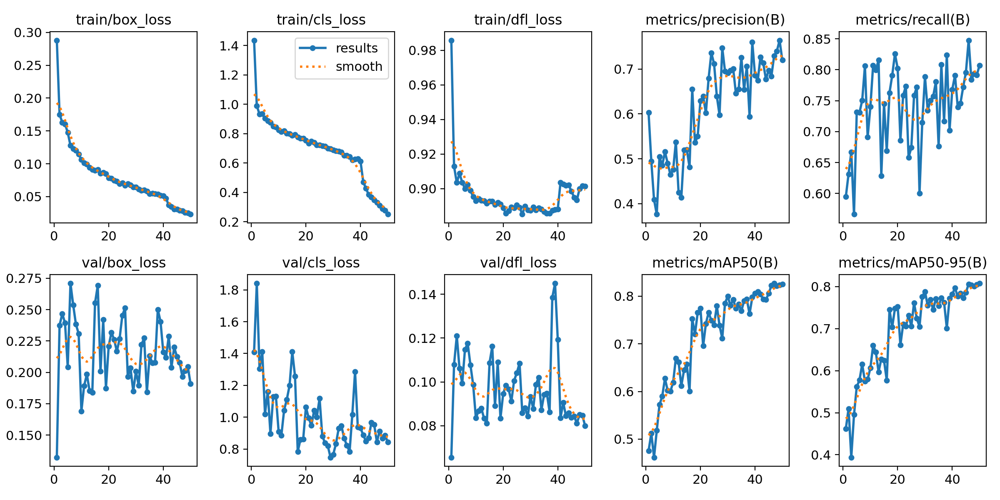

Results2


In [19]:
# display training metrics plot of DFU2.py with model=yolov8s.pt, epochs=50, imgsz=224, batch=32

from IPython.display import Image, display

# Path to the training metrics plot
metrics_plot_path = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train9/results.png"  # Update to the correct path

# Display the plot
display(Image(filename=metrics_plot_path))
print("Results2")

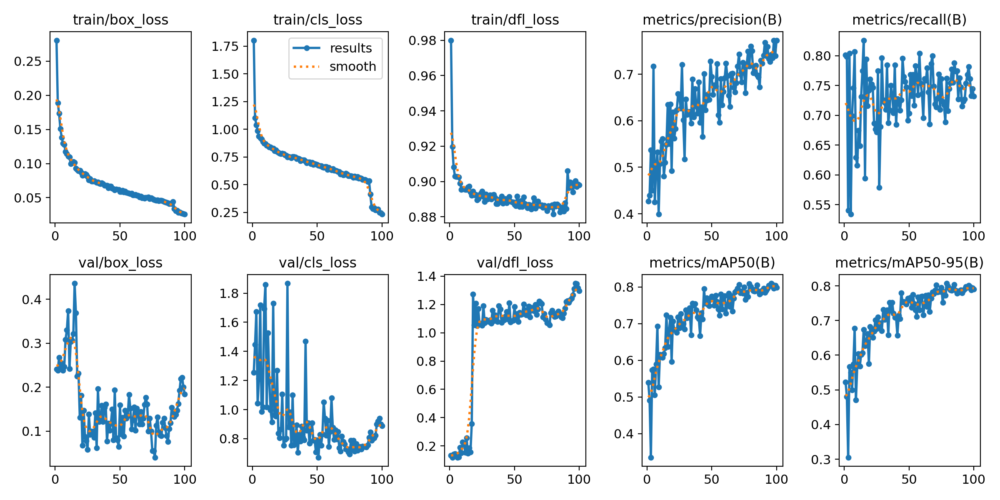

Results3


In [20]:
# display training metrics plot of DFU3.py with model=yolov8n.pt, epochs=100, imgsz=224, batch=16

from IPython.display import Image, display

# Path to the training metrics plot
metrics_plot_path = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train10/results.png"  # Update to the correct path

# Display the plot
display(Image(filename=metrics_plot_path))
print("Results3")

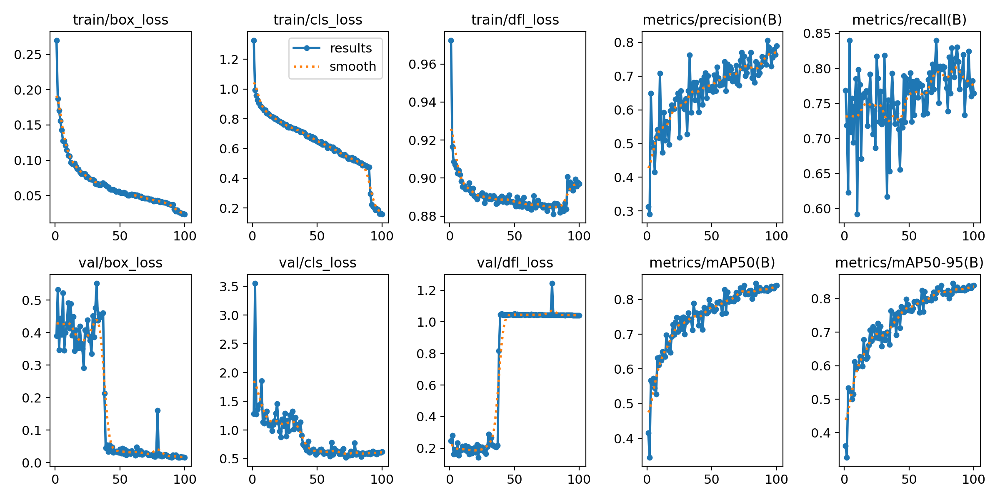

Results4


In [21]:
# display training metrics plot of DFU4.py with model=yolov8s.pt, epochs=100, imgsz=224, batch=16

from IPython.display import Image, display

# Path to the training metrics plot
metrics_plot_path = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train11/results.png"  # Update to the correct path

# Display the plot
display(Image(filename=metrics_plot_path))
print("Results4")

   epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1  11.9566         0.29511         1.99956         0.99151   
1      2  21.9920         0.18031         1.10679         0.91958   
2      3  31.8697         0.16133         1.01933         0.90511   
3      4  41.8303         0.15868         0.99201         0.90720   
4      5  51.6423         0.14268         0.94552         0.90455   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.38417            0.89870           0.55013   
1               0.41634            0.82211           0.53952   
2               0.48777            0.78776           0.56530   
3               0.31326            0.71516           0.41312   
4               0.44542            0.80447           0.57836   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.54312       0.22806       1.25980       0.11854  0.000413   
1              0.52219       0.26336       1

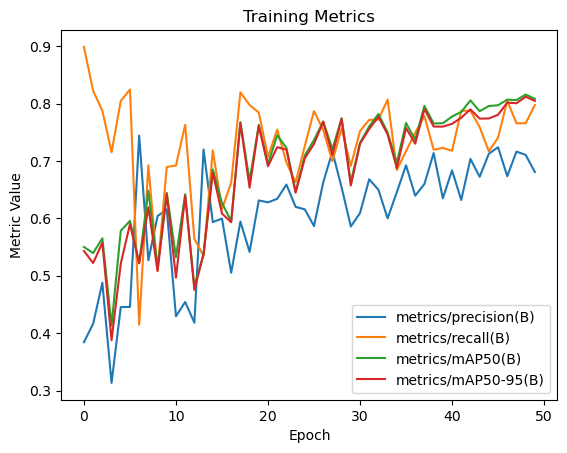

In [11]:
# Load and Visualize Metrics with Pandas of DFU.py with model=yolov8n.pt, epochs=50, imgsz=224, batch=32

import pandas as pd
import matplotlib.pyplot as plt

# Path to the results CSV file
results_csv_path = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train8/results.csv"  # Update to the correct path

# Load the CSV file
metrics_df = pd.read_csv(results_csv_path)

# Display the first few rows
print(metrics_df.head())

# Plot specific metrics
metrics_df[['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']].plot(title="Training Metrics")
plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.show()


   epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1  17.8606         0.28812         1.43624         0.98577   
1      2  34.2237         0.17519         0.98905         0.91292   
2      3  50.0172         0.16289         0.93283         0.90346   
3      4  65.7504         0.16062         0.93591         0.90880   
4      5  81.4826         0.14769         0.90532         0.90360   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.60287            0.59457           0.47526   
1               0.49489            0.63139           0.51230   
2               0.40928            0.66677           0.46179   
3               0.37662            0.56643           0.51804   
4               0.50480            0.73141           0.57210   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.46171       0.13226       1.40973       0.06557  0.000413   
1              0.50974       0.23749       1

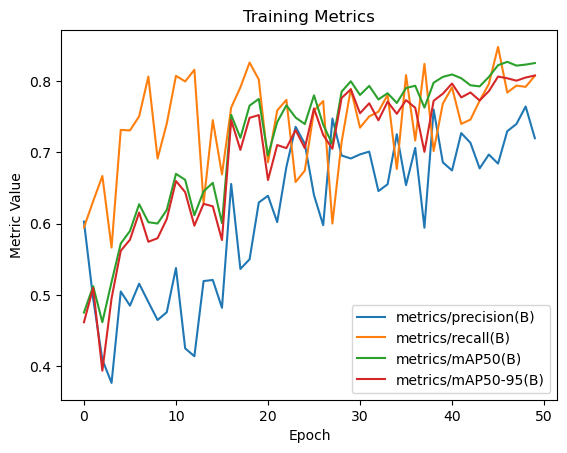

In [15]:
# Load and Visualize Metrics with Pandas of DFU2.py with model=yolov8s.pt, epochs=50, imgsz=224, batch=32

import pandas as pd
import matplotlib.pyplot as plt

# Path to the results CSV file
results_csv_path = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train9/results.csv"  # Update to the correct path

# Load the CSV file
metrics_df = pd.read_csv(results_csv_path)

# Display the first few rows
print(metrics_df.head())

# Plot specific metrics
metrics_df[['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']].plot(title="Training Metrics")
plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.show()

   epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1  14.4489         0.28080         1.80269         0.98003   
1      2  26.9688         0.18878         1.10251         0.91984   
2      3  39.2237         0.17354         1.03991         0.90812   
3      4  51.2324         0.15098         0.98489         0.90303   
4      5  63.0586         0.13835         0.93804         0.90281   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.42668            0.80096           0.53949   
1               0.43992            0.79860           0.49065   
2               0.53749            0.54015           0.33504   
3               0.45008            0.80396           0.57312   
4               0.71764            0.53399           0.57568   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.52212       0.24141       1.25507       0.13251  0.000415   
1              0.48018       0.23809       1

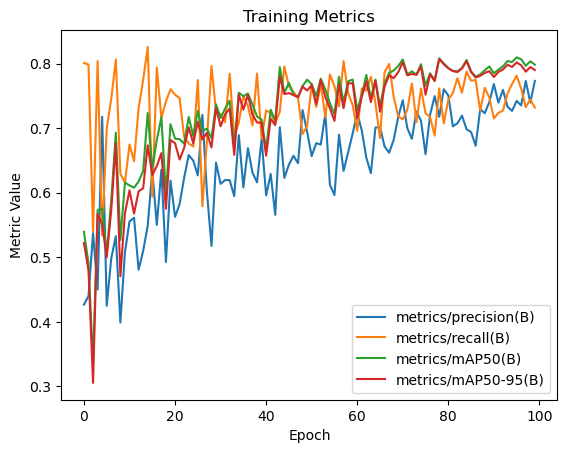

In [16]:
# Load and Visualize Metrics with Pandas of DFU3.py with model=yolov8n.pt, epochs=100, imgsz=224, batch=16

import pandas as pd
import matplotlib.pyplot as plt

# Path to the results CSV file
results_csv_path = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train10/results.csv"  # Update to the correct path

# Load the CSV file
metrics_df = pd.read_csv(results_csv_path)

# Display the first few rows
print(metrics_df.head())

# Plot specific metrics
metrics_df[['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']].plot(title="Training Metrics")
plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.show()

   epoch      time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1   22.5400         0.27020         1.32824         0.97251   
1      2   42.1409         0.18719         0.99273         0.91658   
2      3   61.5095         0.17071         0.95588         0.90875   
3      4   80.6337         0.15611         0.92587         0.90715   
4      5  100.4540         0.14300         0.90756         0.90548   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.31335            0.76857           0.41603   
1               0.29034            0.71839           0.34530   
2               0.64839            0.62281           0.56692   
3               0.50299            0.84015           0.55818   
4               0.48799            0.70898           0.57281   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.36112       0.39060       1.28205       0.24732  0.000415   
1              0.32630       0.53302  

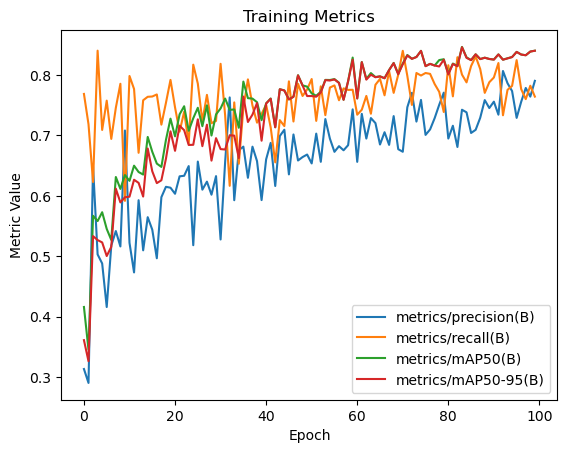

In [17]:
# Load and Visualize Metrics with Pandas of DFU4.py with model=yolov8s.pt, epochs=100, imgsz=224, batch=16

import pandas as pd
import matplotlib.pyplot as plt

# Path to the results CSV file
results_csv_path = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train11/results.csv"  # Update to the correct path

# Load the CSV file
metrics_df = pd.read_csv(results_csv_path)

# Display the first few rows
print(metrics_df.head())

# Plot specific metrics
metrics_df[['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']].plot(title="Training Metrics")
plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.show()

Randomly selected image: /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306577.jpg

image 1/1 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306577.jpg: 224x224 1 infection, 3.9ms
Speed: 0.4ms preprocess, 3.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 224)
Results saved to runs/detect/predict


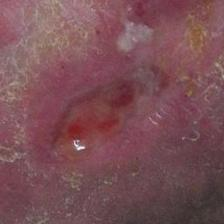

In [26]:
# test the trained model on a single image using DFU1.py with model=yolov8n.pt, epochs=50, imgsz=224, batch=32

from ultralytics import YOLO
import os
import random
from IPython.display import Image, display 

# Load the trained model
model = YOLO("/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train8/weights/best.pt")

# Test on a directory or single image
test_dataset_path = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images"  # Replace with your test images folder

# Get all image files in the test dataset directory
test_images = [os.path.join(test_dataset_path, img) for img in os.listdir(test_dataset_path) if img.endswith(('.jpg', '.png', '.jpeg'))]

# Select a random image for testing
random_image = random.choice(test_images)
print(f"Randomly selected image: {random_image}")

# Run inference on the selected image
save_dir = "/home/rohanb/Documents/mca/ML Mini Project/runs/"
os.makedirs(save_dir, exist_ok=True)  # Create directory if it doesn't exist

results = model.predict(source=random_image, save=True, save_dir=save_dir)  # Use model to predict

# Display the image with predictions
predicted_image_path = os.path.join(save_dir, random_image)  # Update if the saved filename is different
display(Image(filename=predicted_image_path))  # Display the processed image

# Optionally, display the training metrics plot
#metrics_plot_path = "/home/rohanb/Documents/mca/ML Mini Project/runs/detect/train/results.png"  # Update path if needed
#if os.path.exists(metrics_plot_path):
#    display(Image(filename=metrics_plot_path))
#else:
#    print(f"Metrics plot not found at: {metrics_plot_path}")

Randomly selected image: /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306632.jpg

image 1/1 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306632.jpg: 224x224 1 none, 4.4ms
Speed: 0.4ms preprocess, 4.4ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 224)
Results saved to runs/detect/predict2


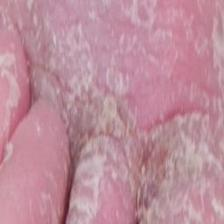

In [27]:
# test the trained model on a single image using DFU2.py with model=yolov8s.pt, epochs=50, imgsz=224, batch=32

from ultralytics import YOLO
import os
import random
from IPython.display import Image, display 

# Load the trained model
model = YOLO("/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train9/weights/best.pt")

# Test on a directory or single image
test_dataset_path = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images"  # Replace with your test images folder

# Get all image files in the test dataset directory
test_images = [os.path.join(test_dataset_path, img) for img in os.listdir(test_dataset_path) if img.endswith(('.jpg', '.png', '.jpeg'))]

# Select a random image for testing
random_image = random.choice(test_images)
print(f"Randomly selected image: {random_image}")

# Run inference on the selected image
save_dir = "/home/rohanb/Documents/mca/ML Mini Project/runs/"
os.makedirs(save_dir, exist_ok=True)  # Create directory if it doesn't exist

results = model.predict(source=random_image, save=True, save_dir=save_dir)  # Use model to predict

# Display the image with predictions
predicted_image_path = os.path.join(save_dir, random_image)  # Update if the saved filename is different
display(Image(filename=predicted_image_path))  # Display the processed image

# Optionally, display the training metrics plot
#metrics_plot_path = "/home/rohanb/Documents/mca/ML Mini Project/runs/detect/train/results.png"  # Update path if needed
#if os.path.exists(metrics_plot_path):
#    display(Image(filename=metrics_plot_path))
#else:
#    print(f"Metrics plot not found at: {metrics_plot_path}")

Randomly selected image: /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306534.jpg

image 1/1 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306534.jpg: 224x224 1 none, 3.9ms
Speed: 0.6ms preprocess, 3.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 224)
Results saved to runs/detect/predict3


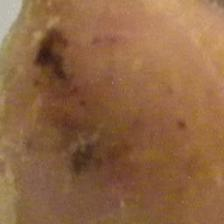

In [28]:
# test the trained model on a single image using DFU3.py with model=yolov8n.pt, epochs=100, imgsz=224, batch=16

from ultralytics import YOLO
import os
import random
from IPython.display import Image, display 

# Load the trained model
model = YOLO("/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train10/weights/best.pt")

# Test on a directory or single image
test_dataset_path = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images"  # Replace with your test images folder

# Get all image files in the test dataset directory
test_images = [os.path.join(test_dataset_path, img) for img in os.listdir(test_dataset_path) if img.endswith(('.jpg', '.png', '.jpeg'))]

# Select a random image for testing
random_image = random.choice(test_images)
print(f"Randomly selected image: {random_image}")

# Run inference on the selected image
save_dir = "/home/rohanb/Documents/mca/ML Mini Project/runs/"
os.makedirs(save_dir, exist_ok=True)  # Create directory if it doesn't exist

results = model.predict(source=random_image, save=True, save_dir=save_dir)  # Use model to predict

# Display the image with predictions
predicted_image_path = os.path.join(save_dir, random_image)  # Update if the saved filename is different
display(Image(filename=predicted_image_path))  # Display the processed image

# Optionally, display the training metrics plot
#metrics_plot_path = "/home/rohanb/Documents/mca/ML Mini Project/runs/detect/train/results.png"  # Update path if needed
#if os.path.exists(metrics_plot_path):
#    display(Image(filename=metrics_plot_path))
#else:
#    print(f"Metrics plot not found at: {metrics_plot_path}")

Randomly selected image: /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306663.jpg

image 1/1 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306663.jpg: 224x224 1 both, 3.9ms
Speed: 0.4ms preprocess, 3.9ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 224)
Results saved to runs/detect/predict4


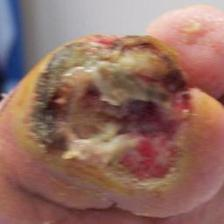

In [29]:
# test the trained model on a single image using DFU4.py with model=yolov8s.pt, epochs=100, imgsz=224, batch=16

from ultralytics import YOLO
import os
import random
from IPython.display import Image, display 

# Load the trained model
model = YOLO("/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train11/weights/best.pt")

# Test on a directory or single image
test_dataset_path = "/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images"  # Replace with your test images folder

# Get all image files in the test dataset directory
test_images = [os.path.join(test_dataset_path, img) for img in os.listdir(test_dataset_path) if img.endswith(('.jpg', '.png', '.jpeg'))]

# Select a random image for testing
random_image = random.choice(test_images)
print(f"Randomly selected image: {random_image}")

# Run inference on the selected image
save_dir = "/home/rohanb/Documents/mca/ML Mini Project/runs/"
os.makedirs(save_dir, exist_ok=True)  # Create directory if it doesn't exist

results = model.predict(source=random_image, save=True, save_dir=save_dir)  # Use model to predict

# Display the image with predictions
predicted_image_path = os.path.join(save_dir, random_image)  # Update if the saved filename is different
display(Image(filename=predicted_image_path))  # Display the processed image

# Optionally, display the training metrics plot
#metrics_plot_path = "/home/rohanb/Documents/mca/ML Mini Project/runs/detect/train/results.png"  # Update path if needed
#if os.path.exists(metrics_plot_path):
#    display(Image(filename=metrics_plot_path))
#else:
#    print(f"Metrics plot not found at: {metrics_plot_path}")

Tested image: 306577.jpg


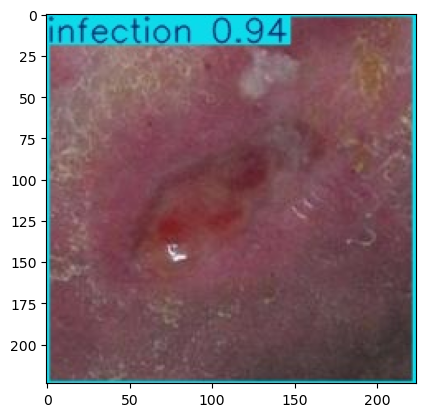

In [30]:
# show the confidence result of the tested image DFU.py

import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Specify the directory path where images are stored
directory_path = "runs/detect/predict"

# Detect all image files (adjust the extensions as needed)
image_files = [f for f in os.listdir(directory_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))]

if image_files:
    # Select a random image file
    _image = random.choice(image_files)
    
    #print("Tested image:", _image)
    
    print("Tested image:", _image)
    # Full path to the selected image
    image_path = os.path.join(directory_path, _image)

    # Load and plot the image
    img = Image.open(image_path)
    plt.imshow(img)
    #plt.axis('off')  # Hide axes for a cleaner display
    plt.show()
else:
    print("No image files found in the directory.")


Tested image: 306632.jpg


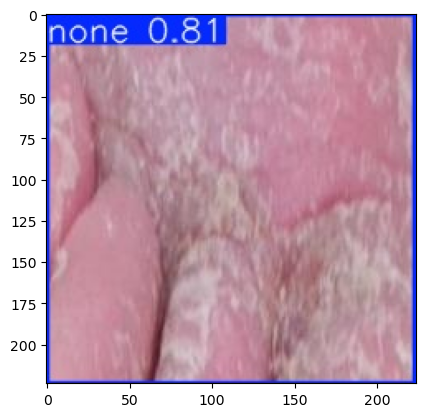

In [31]:
# show the confidence result of the tested image DFU2.py

import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Specify the directory path where images are stored
directory_path = "runs/detect/predict2"

# Detect all image files (adjust the extensions as needed)
image_files = [f for f in os.listdir(directory_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))]

if image_files:
    # Select a random image file
    _image = random.choice(image_files)
    
    #print("Tested image:", _image)
    
    print("Tested image:", _image)
    # Full path to the selected image
    image_path = os.path.join(directory_path, _image)

    # Load and plot the image
    img = Image.open(image_path)
    plt.imshow(img)
    #plt.axis('off')  # Hide axes for a cleaner display
    plt.show()
else:
    print("No image files found in the directory.")


Tested image: 306534.jpg


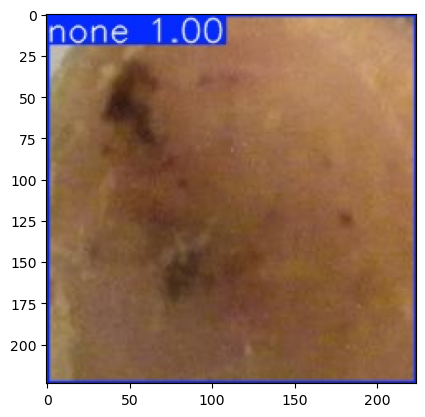

In [32]:
# show the confidence result of the tested image DFU3.py

import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Specify the directory path where images are stored
directory_path = "runs/detect/predict3"

# Detect all image files (adjust the extensions as needed)
image_files = [f for f in os.listdir(directory_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))]

if image_files:
    # Select a random image file
    _image = random.choice(image_files)
    
    #print("Tested image:", _image)
    
    print("Tested image:", _image)
    # Full path to the selected image
    image_path = os.path.join(directory_path, _image)

    # Load and plot the image
    img = Image.open(image_path)
    plt.imshow(img)
    #plt.axis('off')  # Hide axes for a cleaner display
    plt.show()
else:
    print("No image files found in the directory.")


Tested image: 306663.jpg


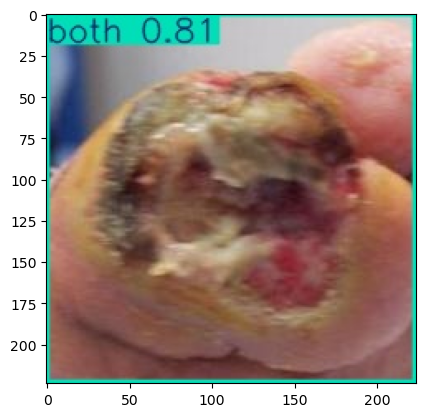

In [33]:
# show the confidence result of the tested image DFU4.py

import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Specify the directory path where images are stored
directory_path = "runs/detect/predict4"

# Detect all image files (adjust the extensions as needed)
image_files = [f for f in os.listdir(directory_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))]

if image_files:
    # Select a random image file
    _image = random.choice(image_files)
    
    #print("Tested image:", _image)
    
    print("Tested image:", _image)
    # Full path to the selected image
    image_path = os.path.join(directory_path, _image)

    # Load and plot the image
    img = Image.open(image_path)
    plt.imshow(img)
    #plt.axis('off')  # Hide axes for a cleaner display
    plt.show()
else:
    print("No image files found in the directory.")


In [34]:
from ultralytics import YOLO
model = YOLO("/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train8/weights/best.pt") # choose best.pt from test file accordingly

results = model.predict(source="/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images", save=True) # use model to predict from given image(s)

print(results)


image 1/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306433.jpg: 224x224 1 none, 4.2ms
image 2/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306434.jpg: 224x224 1 none, 4.0ms
image 3/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306435.jpg: 224x224 1 none, 4.7ms
image 4/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306436.jpg: 224x224 1 none, 4.4ms
image 5/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306437.jpg: 224x224 1 none, 4.3ms
image 6/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306438.jpg: 224x224 1 none, 4.4ms
image 7/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306439.jpg: 224x224 1 non

In [35]:
from ultralytics import YOLO
model = YOLO("/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train9/weights/best.pt") # choose best.pt from test file accordingly

results = model.predict(source="/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images", save=True) # use model to predict from given image(s)

print(results)


image 1/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306433.jpg: 224x224 1 ischaemia, 4.4ms
image 2/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306434.jpg: 224x224 1 none, 4.2ms
image 3/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306435.jpg: 224x224 1 none, 4.1ms
image 4/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306436.jpg: 224x224 1 none, 4.0ms
image 5/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306437.jpg: 224x224 1 none, 4.1ms
image 6/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306438.jpg: 224x224 1 none, 4.7ms
image 7/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306439.jpg: 224x224 

In [37]:
from ultralytics import YOLO
model = YOLO("/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train10/weights/best.pt") # choose best.pt from test file accordingly

results = model.predict(source="/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images", save=True) # use model to predict from given image(s)

print(results)


image 1/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306433.jpg: 224x224 1 none, 3.8ms
image 2/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306434.jpg: 224x224 1 none, 3.9ms
image 3/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306435.jpg: 224x224 1 none, 4.0ms
image 4/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306436.jpg: 224x224 1 none, 4.2ms
image 5/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306437.jpg: 224x224 1 none, 4.9ms
image 6/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306438.jpg: 224x224 1 none, 4.2ms
image 7/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306439.jpg: 224x224 1 non

In [38]:
from ultralytics import YOLO
model = YOLO("/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train11/weights/best.pt") # choose best.pt from test file accordingly

results = model.predict(source="/home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images", save=True) # use model to predict from given image(s)

print(results)


image 1/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306433.jpg: 224x224 1 none, 1 ischaemia, 4.9ms
image 2/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306434.jpg: 224x224 1 none, 4.8ms
image 3/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306435.jpg: 224x224 1 none, 1 infection, 4.6ms
image 4/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306436.jpg: 224x224 1 none, 4.4ms
image 5/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306437.jpg: 224x224 1 none, 4.4ms
image 6/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images/306438.jpg: 224x224 1 none, 4.5ms
image 7/596 /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2021_trainset_210427/test/images

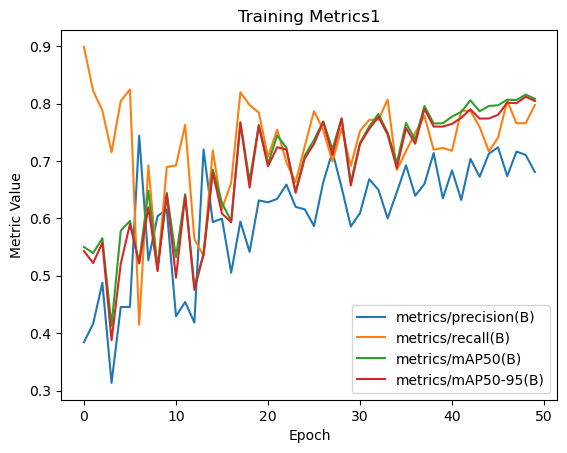

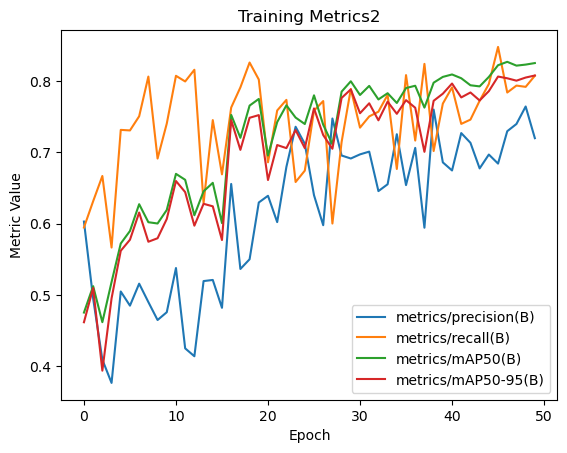

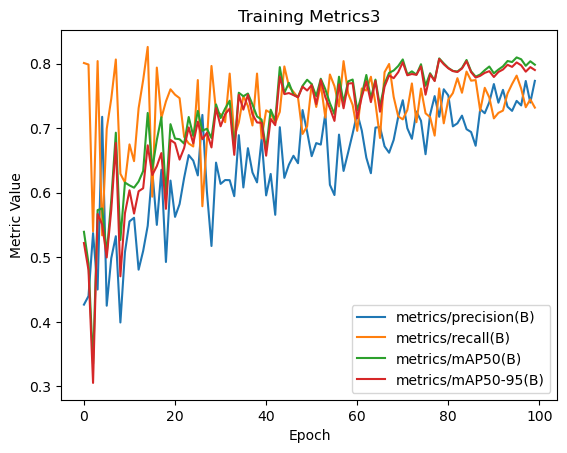

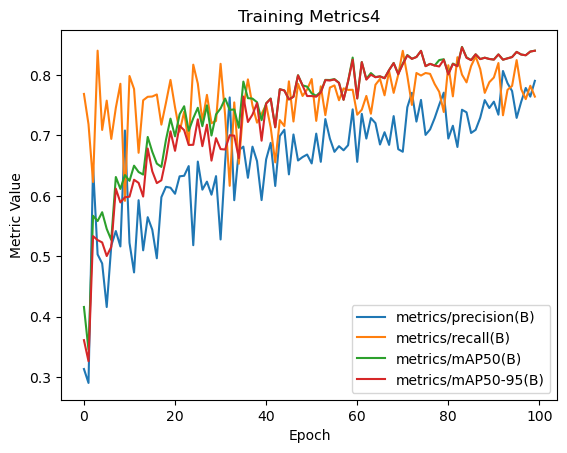

In [12]:
# Load and Visualize Metrics with Pandas of DFU1, DFU2, DFU3, DFU4 

import pandas as pd
import matplotlib.pyplot as plt

# Path to the results CSV file
results_csv_path1 = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train8/results.csv"  # Update to the correct path

# Load the CSV file
metrics_df1 = pd.read_csv(results_csv_path1)

# Display the first few rows
#print(metrics_df.head())

# Plot specific metrics
metrics_df1[['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']].plot(title="Training Metrics1")
plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.show()





# Path to the results CSV file
results_csv_path2 = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train9/results.csv"  # Update to the correct path

# Load the CSV file
metrics_df2 = pd.read_csv(results_csv_path2)

# Display the first few rows
#print(metrics_df.head())

# Plot specific metrics
metrics_df2[['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']].plot(title="Training Metrics2")
plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.show()






results_csv_path3 = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train10/results.csv"  # Update to the correct path

# Load the CSV file
metrics_df3 = pd.read_csv(results_csv_path3)

# Display the first few rows
#print(metrics_df.head())

# Plot specific metrics
metrics_df3[['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']].plot(title="Training Metrics3")
plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.show()






results_csv_path4 = "/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train11/results.csv"  # Update to the correct path

# Load the CSV file
metrics_df4 = pd.read_csv(results_csv_path4)

# Display the first few rows
#print(metrics_df.head())

# Plot specific metrics
metrics_df4[['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']].plot(title="Training Metrics4")
plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.show()


In [12]:
from ultralytics import YOLO
import numpy as np

# Load the YOLOv8 model
model = YOLO('/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train8/weights/best.pt')

# Validate the model on the validation set
results = model.val(data='/home/rohanb/Documents/mca/ML Mini Project/dfu/dataset.yaml')

# Extract relevant metrics
precision = results.box.p
recall = results.box.r
f1_score = results.box.f1
map50 = results.box.map50  # mAP@50
map95 = results.box.map  # mAP@[.5:.95]

#print(f"Precision: {precision:.3f}")
#print(f"Recall: {recall:.3f}")
#print(f"F1-Score: {f1_score:.3f}")
#print(f"mAP@50: {map50:.3f}")
#print(f"mAP@[.5:.95]: {map95:.3f}")


# Calculate overall metrics
precision_mean = np.mean(precision)
recall_mean = np.mean(recall)
f1_mean = np.mean(f1_score)

print(f"Overall Precision: {precision_mean:.3f}")
print(f"Overall Recall: {recall_mean:.3f}")
print(f"Overall F1-Score: {f1_mean:.3f}")

# Print per-class metrics
for i, (p, r, f1) in enumerate(zip(precision, recall, f1_score)):
    print(f"Class {i}: Precision={p:.3f}, Recall={r:.3f}, F1-Score={f1:.3f}")

accuracy = np.mean((precision + recall) / 2)  # Simplified accuracy metric (approximate)
print(f"Approximate Accuracy: {accuracy:.3f}")



Ultralytics 8.3.32 🚀 Python-3.12.7 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 5828MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       1191       1191      0.709      0.766      0.816      0.812
                  none        508        508      0.748        0.9      0.865      0.865
             infection        500        500      0.797       0.72      0.852       0.84
             ischaemia         50         50      0.467       0.82      0.712      0.709
                  both        133        133      0.823      0.624      0.834      0.834
Speed: 0.1ms preprocess, 0.7ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/val16
Overall Precision: 0.709
Overall Recall: 0.766
Overall F1-Score: 0.719
Class 0: Precision=0.748, Recall=0.900, F1-Score=0.817
Class 1: Precision=0.797, Recall=0.720, F1-Score=0.756
Class 2: Precision=0.467, Recall=0.820, F1-Score=0.595
Class 3: Precision=0.823, Recall=0.624, F1-Score=0.710
Approximate Accuracy: 0.737


In [13]:
from ultralytics import YOLO
import numpy as np

# Load the YOLOv8 model
model = YOLO('/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train9/weights/best.pt')

# Validate the model on the validation set
results = model.val(data='/home/rohanb/Documents/mca/ML Mini Project/dfu/dataset.yaml')

# Extract relevant metrics
precision = results.box.p
recall = results.box.r
f1_score = results.box.f1
map50 = results.box.map50  # mAP@50
map95 = results.box.map  # mAP@[.5:.95]

#print(f"Precision: {precision:.3f}")
#print(f"Recall: {recall:.3f}")
#print(f"F1-Score: {f1_score:.3f}")
#print(f"mAP@50: {map50:.3f}")
#print(f"mAP@[.5:.95]: {map95:.3f}")


# Calculate overall metrics
precision_mean = np.mean(precision)
recall_mean = np.mean(recall)
f1_mean = np.mean(f1_score)

print(f"Overall Precision: {precision_mean:.3f}")
print(f"Overall Recall: {recall_mean:.3f}")
print(f"Overall F1-Score: {f1_mean:.3f}")

# Print per-class metrics
for i, (p, r, f1) in enumerate(zip(precision, recall, f1_score)):
    print(f"Class {i}: Precision={p:.3f}, Recall={r:.3f}, F1-Score={f1:.3f}")

accuracy = np.mean((precision + recall) / 2)  # Simplified accuracy metric (approximate)
print(f"Approximate Accuracy: {accuracy:.3f}")


Ultralytics 8.3.32 🚀 Python-3.12.7 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 5828MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       1191       1191      0.726      0.806      0.826      0.808
                  none        508        508      0.776        0.9       0.86      0.852
             infection        500        500      0.797      0.779      0.861      0.828
             ischaemia         50         50       0.52       0.84      0.733      0.722
                  both        133        133      0.811      0.707      0.848       0.83
Speed: 0.0ms preprocess, 1.6ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/val17
Overall Precision: 0.726
Overall Recall: 0.806
Overall F1-Score: 0.755
Class 0: Precision=0.776, Recall=0.900, F1-Score=0.833
Class 1: Precision=0.797, Recall=0.779, F1-Score=0.788
Class 2: Precision=0.520, Recall=0.840, F1-Score=0.643
Class 3: Precision=0.811, Recall=0.707, F1-Score=0.755
Approximate Accuracy: 0.766


In [15]:
from ultralytics import YOLO
import numpy as np

# Load the YOLOv8 model
model = YOLO('/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train10/weights/best.pt')

# Validate the model on the validation set
results = model.val(data='/home/rohanb/Documents/mca/ML Mini Project/dfu/dataset.yaml')

# Extract relevant metrics
precision = results.box.p
recall = results.box.r
f1_score = results.box.f1
map50 = results.box.map50  # mAP@50
map95 = results.box.map  # mAP@[.5:.95]

#print(f"Precision: {precision:.3f}")
#print(f"Recall: {recall:.3f}")
#print(f"F1-Score: {f1_score:.3f}")
#print(f"mAP@50: {map50:.3f}")
#print(f"mAP@[.5:.95]: {map95:.3f}")


# Calculate overall metrics
precision_mean = np.mean(precision)
recall_mean = np.mean(recall)
f1_mean = np.mean(f1_score)

print(f"Overall Precision: {precision_mean:.3f}")
print(f"Overall Recall: {recall_mean:.3f}")
print(f"Overall F1-Score: {f1_mean:.3f}")

# Print per-class metrics
for i, (p, r, f1) in enumerate(zip(precision, recall, f1_score)):
    print(f"Class {i}: Precision={p:.3f}, Recall={r:.3f}, F1-Score={f1:.3f}")

accuracy = np.mean((precision + recall) / 2)  # Simplified accuracy metric (approximate)
print(f"Approximate Accuracy: {accuracy:.3f}")

Ultralytics 8.3.32 🚀 Python-3.12.7 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 5828MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       1191       1191       0.72      0.758      0.808      0.807
                  none        508        508      0.764      0.865       0.87       0.87
             infection        500        500      0.806      0.722      0.846      0.844
             ischaemia         50         50      0.536       0.74      0.703      0.702
                  both        133        133      0.774      0.707      0.811      0.811
Speed: 0.1ms preprocess, 0.7ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/val19
Overall Precision: 0.720
Overall Recall: 0.758
Overall F1-Score: 0.733
Class 0: Precision=0.764, Recall=0.865, F1-Score=0.811
Class 1: Precision=0.806, Recall=0.722, F1-Score=0.762
Class 2: Precision=0.536, Recall=0.740, F1-Score=0.622
Class 3: Precision=0.774, Recall=0.707, F1-Score=0.739
Approximate Accuracy: 0.739


In [16]:
from ultralytics import YOLO
import numpy as np

# Load the YOLOv8 model
model = YOLO('/home/rohanb/Documents/mca/ML Mini Project/dfu/runs/detect/train11/weights/best.pt')

# Validate the model on the validation set
results = model.val(data='/home/rohanb/Documents/mca/ML Mini Project/dfu/dataset.yaml')

# Extract relevant metrics
precision = results.box.p
recall = results.box.r
f1_score = results.box.f1
map50 = results.box.map50  # mAP@50
map95 = results.box.map  # mAP@[.5:.95]

#print(f"Precision: {precision:.3f}")
#print(f"Recall: {recall:.3f}")
#print(f"F1-Score: {f1_score:.3f}")
#print(f"mAP@50: {map50:.3f}")
#print(f"mAP@[.5:.95]: {map95:.3f}")


# Calculate overall metrics
precision_mean = np.mean(precision)
recall_mean = np.mean(recall)
f1_mean = np.mean(f1_score)

print(f"Overall Precision: {precision_mean:.3f}")
print(f"Overall Recall: {recall_mean:.3f}")
print(f"Overall F1-Score: {f1_mean:.3f}")

# Print per-class metrics
for i, (p, r, f1) in enumerate(zip(precision, recall, f1_score)):
    print(f"Class {i}: Precision={p:.3f}, Recall={r:.3f}, F1-Score={f1:.3f}")

accuracy = np.mean((precision + recall) / 2)  # Simplified accuracy metric (approximate)
print(f"Approximate Accuracy: {accuracy:.3f}")

Ultralytics 8.3.32 🚀 Python-3.12.7 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 5828MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /home/rohanb/Documents/mca/ML Mini Project/provided_datasets/DFUC2
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       1191       1191      0.742      0.802      0.847      0.846
                  none        508        508      0.766      0.909      0.878      0.877
             infection        500        500      0.797      0.782      0.887      0.887
             ischaemia         50         50      0.605      0.765      0.755      0.753
                  both        133        133        0.8      0.752      0.866      0.866
Speed: 0.1ms preprocess, 1.6ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/val20
Overall Precision: 0.742
Overall Recall: 0.802
Overall F1-Score: 0.768
Class 0: Precision=0.766, Recall=0.909, F1-Score=0.832
Class 1: Precision=0.797, Recall=0.782, F1-Score=0.789
Class 2: Precision=0.605, Recall=0.765, F1-Score=0.676
Class 3: Precision=0.800, Recall=0.752, F1-Score=0.775
Approximate Accuracy: 0.772
